CONCORD integrates seamlessly with `AnnData` objects.
Single-cell datasets — such as standard 10x Genomics outputs — can be easily loaded into an `AnnData` object using the Scanpy package.

If you are starting with a `Seurat` object, follow [this tutorial](../seurat_anndata_conv/) to convert it into an Anndata object.

In this quick-start example, we demonstrate how to use CONCORD with the built-in pbmc3k dataset provided by the scanpy package.

### Load package and data

In [1]:
# Load required packages
import concord as ccd
import scanpy as sc
import torch
from pathlib import Path
save_dir = Path("./save/")
save_dir.mkdir(parents=True, exist_ok=True)
# Load and prepare example data
adata = sc.datasets.pbmc3k_processed()
adata = adata.raw.to_adata()  # Assume starting from raw counts
# (Optional) Select top variably expressed/accessible features for analysis (other methods besides seurat_v3 available)
feature_list = ccd.ul.select_features(adata, n_top_features=2000, flavor='seurat_v3')
sc.pp.normalize_total(adata) # Normalize counts per cell
sc.pp.log1p(adata) # Log-transform data

  0%|          | 0.00/23.5M [00:00<?, ?B/s]

concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...


/opt/anaconda3/envs/concord/lib/python3.12/site-packages/scanpy/preprocessing/_highly_variable_genes.py:74: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


### Run CONCORD

In [2]:
# Set device to cpu or to gpu (if your torch has been set up correctly to use GPU), for mac you can use either torch.device('mps') or torch.device('cpu')
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Initialize Concord with an AnnData object, skip input_feature to use all features, set preload_dense=False if your data is very large
cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, device=device, preload_dense=True) 

# If integrate across batches, provide domain_key (a column in adata.obs that contains batch label):
# cur_ccd = ccd.Concord(adata=adata, input_feature=feature_list, domain_key='batch', device=device, preload_dense=True) 

# Encode data, saving the latent embedding in adata.obsm['Concord']
cur_ccd.fit_transform(output_key='Concord')

concord - WARNING - domain/batch information not found, all samples will be treated as from single domain/batch.
concord - WARNING - Only one domain found in the data. Setting p_intra_domain to 1.0.
Epoch 0 Training
Epoch 1 Training
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training


### Visualization

CONCORD latent embeddings can be directly used for downstream analyses such as visualization with UMAP and t-SNE or constructing k-nearest neighbor (kNN) graphs. Unlike PCA, it is important to utilize the full CONCORD latent embedding in downstream analyses, as each dimension is designed to capture meaningful and complementary aspects of the underlying data structure.

/opt/anaconda3/envs/concord/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


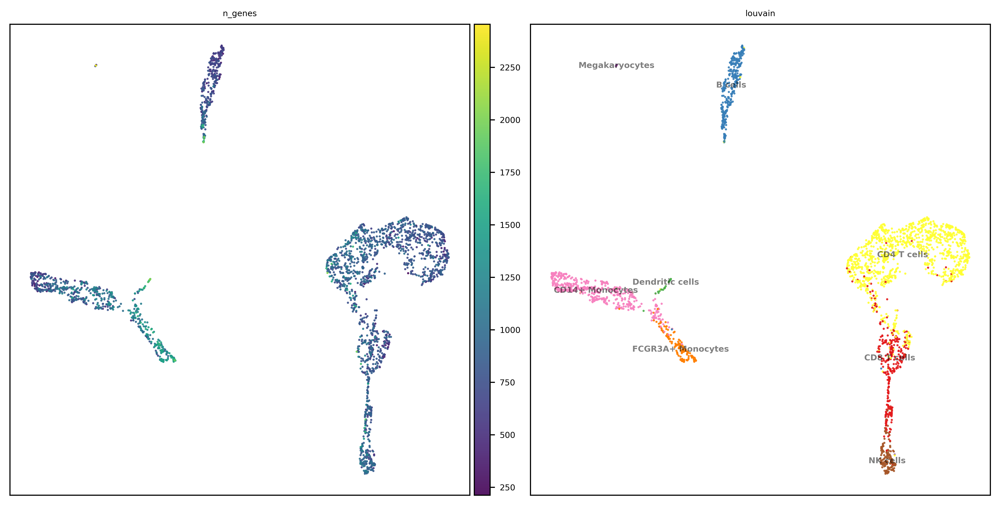

In [3]:
ccd.ul.run_umap(adata, source_key='Concord', result_key='Concord_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='cosine')

# Plot the UMAP embeddings
color_by = ['n_genes', 'louvain'] # Choose which variables you want to visualize
ccd.pl.plot_embedding(
    adata, basis='Concord_UMAP', color_by=color_by, figsize=(10, 5), dpi=600, ncols=2, font_size=6, point_size=10, legend_loc='on data',
    save_path=save_dir / 'Concord_UMAP.png'
)

The latent space produced by CONCORD often capture complex biological structures that may not be fully visualized in 2D projections. We recommend exploring the latent space using a 3D UMAP to more effectively capture and examine the intricacies of the data. For example:

In [4]:
ccd.ul.run_umap(adata, source_key='Concord', result_key='Concord_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='cosine')
# Plot the 3D UMAP embeddings
import plotly.io as pio
pio.renderers.default = 'notebook'
col = 'louvain'
fig = ccd.pl.plot_embedding_3d(
    adata, basis='Concord_UMAP_3D', color_by=col, 
    save_path=save_dir / 'Concord_UMAP_3D.html',
    point_size=3, opacity=0.8, width=1500, height=1000
)